#Name: Mandy He
#CA03 - Decision Tree


In [177]:
#Import packages
import pandas as pd
import numpy as np
#Import visualization package
import matplotlib.pyplot as plt
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
#label encoding package
from sklearn.preprocessing import LabelEncoder
#Sklearn packages
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score



#2.Data Quality Analysis (DQA)

###Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.

In [178]:
#Read dataset
census = pd.read_csv('/content/drive/MyDrive/MSBA_Colab_2020/ML Algorithms/Decision_Tree/census_data.csv')
census.head()

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


In [179]:
#check if there is NULL values in the dataset
census.isnull().sum()
#no null values

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [180]:
#count number of train and test dataset
census.flag.value_counts()

train    32561
test     16281
Name: flag, dtype: int64

###Display descriptive statistics of each column

In [181]:
#Dataset description
census.describe()
census.shape
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   hours_per_week_bin  48842 non-null  object
 1   occupation_bin      48842 non-null  object
 2   msr_bin             48842 non-null  object
 3   capital_gl_bin      48842 non-null  object
 4   race_sex_bin        48842 non-null  object
 5   education_num_bin   48842 non-null  object
 6   education_bin       48842 non-null  object
 7   workclass_bin       48842 non-null  object
 8   age_bin             48842 non-null  object
 9   flag                48842 non-null  object
 10  y                   48842 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 4.1+ MB


###Perform necessary data cleansing and transformation based on your observations from the data quality analysis

In [182]:
#No need to do further data cleansing or transformation
census.head(5)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0


#3.Exploratory Data Analysis (EDA)

###Perform EDA of the income group with respect to the seven explanatory variables
and display graphical representations as shown below.

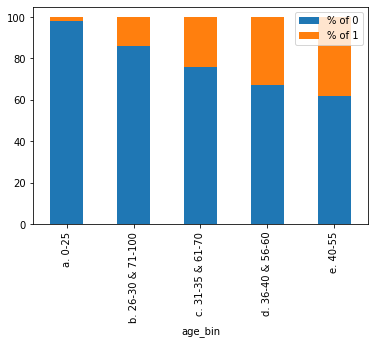

In [183]:
#Age

age1 = census[census.y == 1].groupby('age_bin')[['y']].count()
age0 = census[census.y == 0].groupby('age_bin')[['y']].count()
age = pd.merge(age1, age0, on ='age_bin')
age.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
age['% of 1'] =  age['>50k'] / (age['<=50k'] + age['>50k']) * 100
age['% of 0'] =  age['<=50k'] / (age['<=50k'] + age['>50k']) * 100
age = age.loc[:,['% of 0', '% of 1']]
age.plot( kind= 'bar', stacked = True)

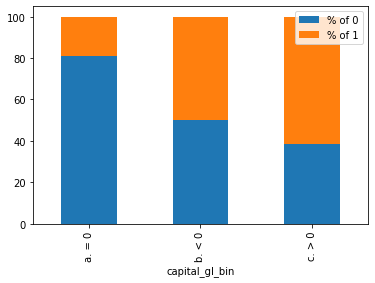

In [184]:
#Capital gain

capital_gl_bin1 = census[census.y == 1].groupby('capital_gl_bin')[['y']].count()
capital_gl_bin0 = census[census.y == 0].groupby('capital_gl_bin')[['y']].count()
capital = pd.merge(capital_gl_bin1, capital_gl_bin0, on ='capital_gl_bin')
capital.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
capital['% of 1'] =  capital['>50k'] / (capital['<=50k'] + capital['>50k']) * 100
capital['% of 0'] =  capital['<=50k'] / (capital['<=50k'] + capital['>50k']) * 100
capital = capital.loc[:,['% of 0', '% of 1']]
capital.plot( kind= 'bar', stacked = True)

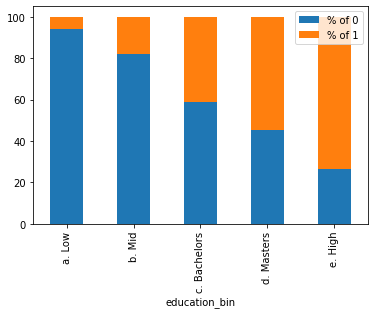

In [185]:
#Education

education1 = census[census.y == 1].groupby('education_bin')[['y']].count()
education0 = census[census.y == 0].groupby('education_bin')[['y']].count()
education = pd.merge(education1, education0, on ='education_bin')
education.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
education['% of 1'] =  education['>50k'] / (education['<=50k'] + education['>50k']) * 100
education['% of 0'] =  education['<=50k'] / (education['<=50k'] + education['>50k']) * 100
education= education.loc[:,['% of 0', '% of 1']]
education.plot( kind= 'bar', stacked = True)

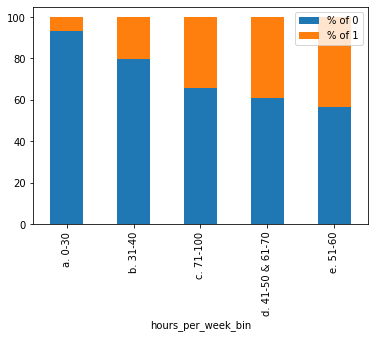

In [186]:
#Hours Per Week

Hours1 = census[census.y == 1].groupby('hours_per_week_bin')[['y']].count()
Hours0 = census[census.y == 0].groupby('hours_per_week_bin')[['y']].count()
Hours = pd.merge(Hours1, Hours0, on ='hours_per_week_bin')
Hours.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
Hours['% of 1'] =  Hours['>50k'] / (Hours['<=50k'] + Hours['>50k']) * 100
Hours['% of 0'] =  Hours['<=50k'] / (Hours['<=50k'] + Hours['>50k']) * 100
Hours= Hours.loc[:,['% of 0', '% of 1']]
Hours.plot( kind= 'bar', stacked = True)

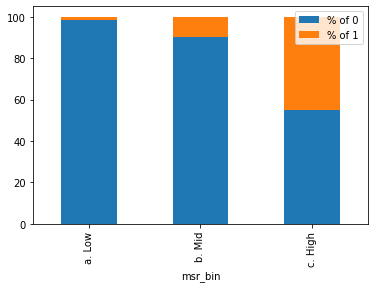

In [187]:
#Marriage Status and Relationship

Marriage1 = census[census.y == 1].groupby('msr_bin')[['y']].count()
Marriage0 = census[census.y == 0].groupby('msr_bin')[['y']].count()
Marriage = pd.merge(Marriage1, Marriage0, on ='msr_bin')
Marriage.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
Marriage['% of 1'] =  Marriage['>50k'] / (Marriage['<=50k'] + Marriage['>50k']) * 100
Marriage['% of 0'] = Marriage['<=50k'] / (Marriage['<=50k'] + Marriage['>50k']) * 100
Marriage= Marriage.loc[:,['% of 0', '% of 1']]
Marriage.plot( kind= 'bar', stacked = True)

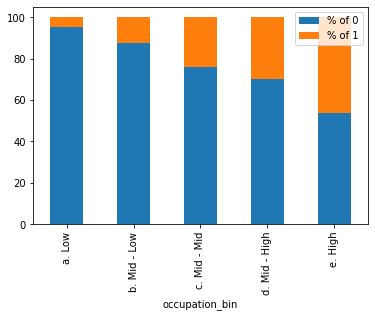

In [188]:
#Occupation

Occupation1 = census[census.y == 1].groupby('occupation_bin')[['y']].count()
Occupation0 = census[census.y == 0].groupby('occupation_bin')[['y']].count()
Occupation = pd.merge(Occupation1, Occupation0, on ='occupation_bin')
Occupation.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
Occupation['% of 1'] =  Occupation['>50k'] / (Occupation['<=50k'] + Occupation['>50k']) * 100
Occupation['% of 0'] = Occupation['<=50k'] / (Occupation['<=50k'] + Occupation['>50k']) * 100
Occupation= Occupation.loc[:,['% of 0', '% of 1']]
Occupation.plot( kind= 'bar', stacked = True)

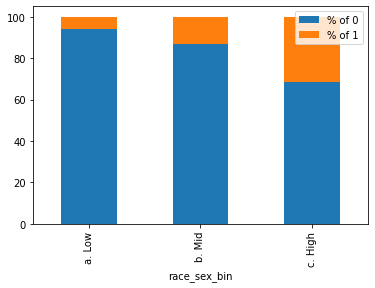

In [189]:
#Race and Sex

RS1 = census[census.y == 1].groupby('race_sex_bin')[['y']].count()
RS0 = census[census.y == 0].groupby('race_sex_bin')[['y']].count()
RS = pd.merge(RS1,RS0, on ='race_sex_bin')
RS.rename(columns = {'y_x': '>50k', 'y_y':'<=50k'}, inplace=True)
RS['% of 1'] =  RS['>50k'] / (RS['<=50k'] + RS['>50k']) * 100
RS['% of 0'] = RS['<=50k'] / (RS['<=50k'] + RS['>50k']) * 100
RS= RS.loc[:,['% of 0', '% of 1']]
RS.plot( kind= 'bar', stacked = True)

#4.Build Decision Tree Classifier Models

###Use “DecisionTreeClassifier” algorithm from scikit learn. Find details of sklearn tree algorithm below. Scitkit Learn implements an optimized version of CART algorithm and can be used for binary class as well a

In [190]:
# select the columns that we want to change
columns = ['hours_per_week_bin','occupation_bin','msr_bin', 'capital_gl_bin', 'race_sex_bin', 'education_num_bin', 'education_bin', 'workclass_bin', 'age_bin']

In [191]:
# change to categorical data
census[columns] = census[columns].astype('category')

In [192]:
#Label encoding
census = census.apply(LabelEncoder().fit_transform)

In [193]:
# flag means test data or train data
# only keep train dataset
# y 0,1 means > 50k or <=50k
trainx = census[census.flag == 1].drop(['y'], axis = 1)
trainy = census[census.flag == 1][['y']]

In [194]:
# only keep test dataset
testx = census[census.flag == 0].drop(['y'], axis = 1)
testy = census[census.flag == 0][['y']]

In [195]:
# binary class decision tree classifier 
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(max_depth = 10,
                               random_state = 101,
                               max_features = None,
                               min_samples_leaf = 15)
dtree.fit(trainx, trainy)
y_pred = dtree.predict(testx)             

#5.Visualize Your Decision Tree using GraphViz

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.757916 to fit



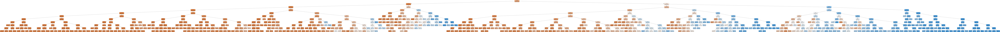

In [196]:
#create decision tree viz
#set file object
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#6.Evaluate Decision Tree Performance

###Confusion Matrix (TP, TN, FP, FN … etc.) Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)

In [197]:
print(confusion_matrix(testy, y_pred))
print(classification_report(testy, y_pred))

[[11607   828]
 [ 1715  2131]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     12435
           1       0.72      0.55      0.63      3846

    accuracy                           0.84     16281
   macro avg       0.80      0.74      0.76     16281
weighted avg       0.84      0.84      0.84     16281



In [198]:
tn, fp, fn, tp = confusion_matrix(testy, y_pred).ravel()
(tn, fp, fn, tp)

#tn 11607, fp 828, fn 1715, tp 2131

(11607, 828, 1715, 2131)

In [200]:
score = accuracy_score(testy, y_pred)
score
# accuracy: 0.8438056630428107

0.8438056630428107

In [201]:
fpr, tpr, thresholds = roc_curve(testy, y_pred)
auc = roc_auc_score(testy, y_pred)
auc
# auc: 0.7437479573971861

0.7437479573971861

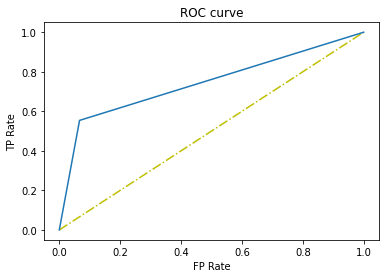

In [202]:
plt.plot([0,1],[0,1],'y-.')
plt.plot(fpr, tpr)
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')
plt.title('ROC curve')
plt.show()

#7.Tune Decision Tree Performance

In [203]:
#1.1

dtree = DecisionTreeClassifier(criterion= 'entropy', min_samples_split =5, min_samples_leaf = 5, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8431914501566243
recall socre:  0.5665626625065002
precision socre:  0.7109298531810767
f1 score:  0.630588916220518


In [204]:
#1.2

dtree = DecisionTreeClassifier(criterion= 'entropy', min_samples_split =5, min_samples_leaf = 5, max_depth=5)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8369879000061421
recall socre:  0.4953198127925117
precision socre:  0.7276546982429335
f1 score:  0.5894183168316831


In [205]:
#1.3

dtree = DecisionTreeClassifier(criterion= 'entropy', min_samples_split =5, min_samples_leaf = 10, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8435599778883361
recall socre:  0.5691627665106604
precision socre:  0.7109451120493667
f1 score:  0.632202166064982


In [206]:
#1.4

dtree = DecisionTreeClassifier(criterion= 'entropy', min_samples_split =3, min_samples_leaf = 5, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.843252871445243
recall socre:  0.5663026521060842
precision socre:  0.7112998040496408
f1 score:  0.6305732484076433


In [207]:
#2.1

dtree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =5, min_samples_leaf = 5, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8428843437135312
recall socre:  0.5608424336973479
precision socre:  0.7128222075346993
f1 score:  0.6277648428405123


In [208]:
#2.2

dtree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =5, min_samples_leaf = 5, max_depth=5)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8395675941281248
recall socre:  0.5769630785231409
precision socre:  0.6925717852684145
f1 score:  0.6295035460992908


In [209]:
#2.3

dtree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =5, min_samples_leaf = 10, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.843744241754192
recall socre:  0.5650026001040042
precision socre:  0.7138633377135348
f1 score:  0.6307692307692307


In [210]:
#2.4

dtree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =3, min_samples_leaf = 5, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))
print('recall socre: ', recall_score(testy, y_pred))
print('precision socre: ', precision_score(testy, y_pred))
print('f1 score: ', f1_score(testy, y_pred))

accuracy socre:  0.8431300288680057
recall socre:  0.5624024960998439
precision socre:  0.7129202373104813
f1 score:  0.6287790697674418


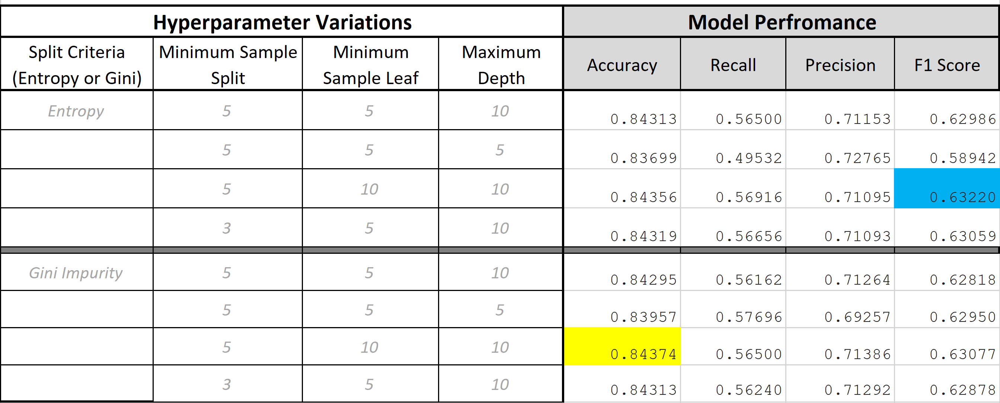

#8.Conclusion

In [246]:
#runtime
%time
dtree.fit(trainx,trainy)
y_pred = dtree.predict(testx)
#6.91 ms

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.91 µs


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.63671 to fit



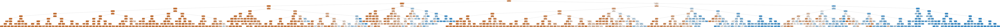

In [212]:
#Best tree is the one has higest accuracy socre


besttree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =5, min_samples_leaf = 10, max_depth=10)

besttree.fit(trainx, trainy)
y_pred=besttree.predict(testx)

dot_data = StringIO()
export_graphviz(besttree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#9.Automation of Performance Tuning

Can you “automate” generation of the above “Hyperparameter Vs. Model Performance Table” in your code itself and display the table in your Notebook?

In [213]:
auto_df = pd.read_csv('/content/drive/MyDrive/MSBA_Colab_2020/ML Algorithms/Decision_Tree/auto_data.csv')

In [245]:
for record in range(0,1):
        criterion = auto_df.iloc[record, 0]
        min_samples_split = auto_df.iloc[record, 1] 
        min_samples_leaf = auto_df.iloc[record, 2] 
        max_depth = auto_df.iloc[record, 3]
        
        
        dtree = DecisionTreeClassifier(criterion= criterion, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf, max_depth = max_depth, random_state = 101, max_features= None)
        
        dtree.fit(trainx, trainy)
        y_pred=dtree.predict(testx)
        
        accuracylist = []     
        recalllist = []
        precisionlist = []
        f1list = []
        
        accuracy =  accuracy_score(testy, y_pred)
        recall = recall_score(testy, y_pred)
        precision = precision_score(testy, y_pred)
        f1 = f1_score(testy, y_pred)
        
        accuracylist.append(accuracy)
        recalllist.append(recall)
        precisionlist.append(precision)
        f1list.append(f1)

auto_df.iloc[record, 4] = accuracylist
auto_df.iloc[record, 5] = recalllist
auto_df.iloc[record, 6] = precisionlist
auto_df.iloc[record, 7] = f1list

auto_df

,Split Criteria,Minimum Sample Split,Minimum Sample Leaf,Maximum Depth,Accuracy,Recall,Precision,F1 Score
0,entropy,5,5,10,0.843191,0.565523,0.711482,0.630161
1,entropy,5,5,5,0.836988,0.495320,0.727655,0.589418
2,entropy,5,10,10,0.843560,0.569163,0.710945,0.632202
3,entropy,3,5,10,NaN,NaN,NaN,NaN
4,gini,5,5,10,0.842946,0.561622,0.712636,0.628181
5,gini,5,5,5,0.839568,0.576963,0.692572,0.629504
6,gini,5,10,10,0.843744,0.565003,0.713863,0.630769
7,gini,3,5,10,0.842946,0.561622,0.712636,0.628181


#10. Prediction using your “trained” Decision Tree Model

In [157]:
# create new record and corresponding columns name

newtest = [['d. 41-50 & 61-70', 'b. Mid-Low', 'c. >0', 'b. Mid', 'b. 9-12', 'e. High', 'b. income', 'd. 36-40', 'd. 36-40 & 56-60']]
newcol =  ['hours_per_week_bin','occupation_bin','msr_bin', 'capital_gl_bin', 'race_sex_bin', 'education_num_bin', 'education_bin', 'workclass_bin', 'age_bin']

In [163]:
#create a new dataframe for new record
newdf = pd.DataFrame(data = newtest, 
                     columns = newcol)

In [165]:
#change data type

newdf[newcol] = newdf[newcol].astype('category')

In [171]:
# label encoding
from sklearn.preprocessing import LabelEncoder
census[newcol]= census[newcol].apply(LabelEncoder().fit_transform)

In [176]:
# run the best tree model again

dtree = DecisionTreeClassifier(criterion= 'gini', min_samples_split =5, min_samples_leaf = 10, max_depth=10)
dtree.fit(trainx, trainy)
y_pred=dtree.predict(testx)
confusion_matrix(testy, y_pred)
print('accuracy socre: ', accuracy_score(testy, y_pred))

# accuracy score is 0.8435599778883361

accuracy socre:  0.8435599778883361
